In [1]:
# ignore Warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
import math, time, random, datetime

# data analysis and wrangling
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport

In [3]:
# visualization
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('seaborn-whitegrid')

#import for interactive plotting
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
%matplotlib inline

In [4]:
# Preprocessing
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, label_binarize, StandardScaler

In [5]:
# machine learning
from sklearn import model_selection, tree, preprocessing, metrics, linear_model
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import Perceptron,SGDClassifier,LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split,StratifiedKFold, GridSearchCV, learning_curve, cross_val_score
from catboost import CatBoostClassifier, Pool, cv

# Import and Inspect Data

In [6]:
df = pd.read_csv('Dataset FinPro.csv')

In [7]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [8]:
df.shape

(1470, 35)

# Data Summary

In [9]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
df['Attrition'] = df['Attrition'].apply(lambda x:1 if x == "Yes" else 0 )
df['OverTime'] = df['OverTime'].apply(lambda x:1 if x =="Yes" else 0 )

In [11]:
# Define visualization for categorical features

def categorical_column_viz(col_name):
    f, ax = plt.subplots(1, 2, figsize=(10, 6))

    # Count Plot
    df[col_name].value_counts().plot.bar(cmap='Set1', ax=ax[0])
    ax[0].set_title(f'Number of Employee by {col_name}')
    ax[0].set_ylabel('Count')
    ax[0].set_xlabel(f'{col_name}')

    # Attrition Count per factors
    sns.countplot(x=col_name, hue='Attrition', data=df, ax=ax[1], palette='Set1')
    ax[1].set_title(f'Attrition by {col_name}')
    ax[1].set_xlabel(f'{col_name}')
    ax[1].set_ylabel('Count')

In [12]:
# Define visualization for numerical features

def numerical_column_viz(col_name):
    f,ax = plt.subplots(1,2, figsize=(18,6))
    sns.kdeplot(attrition[col_name], label='Employee who left',ax=ax[0], shade=True, color='palegreen')
    sns.kdeplot(no_attrition[col_name], label='Employee who stayed', ax=ax[0], shade=True, color='salmon')
    
    sns.boxplot(y=col_name, x='Attrition',data=df, palette='Set3', ax=ax[1])

## Extracting Features

In [13]:
# drop the unnecessary columns (based EDA Stage 1)
df.drop(['EmployeeNumber','Over18','StandardHours','EmployeeCount'],axis=1,inplace=True)

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 31 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   int64 
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EnvironmentSatisfaction   1470 non-null   int64 
 9   Gender                    1470 non-null   object
 10  HourlyRate                1470 non-null   int64 
 11  JobInvolvement            1470 non-null   int64 
 12  JobLevel                  1470 non-null   int64 
 13  JobRole                   1470 non-null   object
 14  JobSatisfaction         

In [15]:
# 'EnviornmentSatisfaction', 'JobInvolvement', 'JobSatisfacction', 'RelationshipSatisfaction', 'WorklifeBalance' can be clubbed into a single feature 'Accumulated_Satisfaction'

df['Accumulated_Satisfaction'] = (df['EnvironmentSatisfaction'] + 
                            df['JobInvolvement'] + 
                            df['JobSatisfaction'] + 
                            df['RelationshipSatisfaction'] +
                            df['WorkLifeBalance']) /5 

In [16]:
attrition = df[df['Attrition'] == 1]
no_attrition = df[df['Attrition']==0]

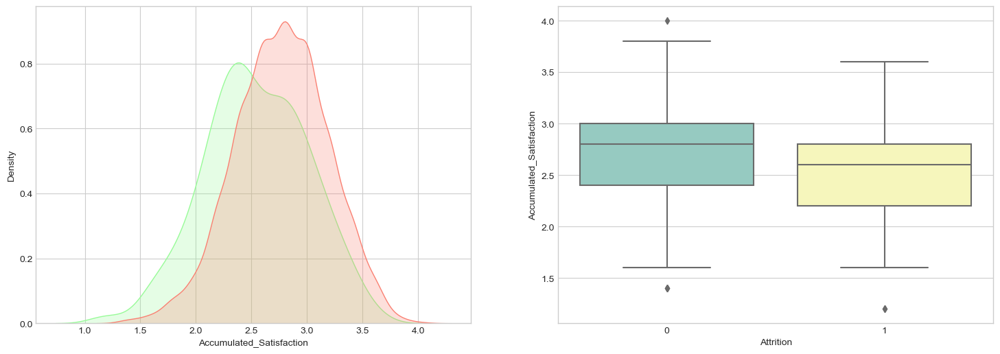

In [17]:
numerical_column_viz('Accumulated_Satisfaction')

In [18]:
df.Accumulated_Satisfaction.describe()

count    1470.000000
mean        2.730748
std         0.428551
min         1.200000
25%         2.400000
50%         2.800000
75%         3.000000
max         4.000000
Name: Accumulated_Satisfaction, dtype: float64

In [19]:
df.corr()

,Age,Attrition,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,...,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Accumulated_Satisfaction
Age,1.000000,-0.159205,0.010661,-0.001686,0.208034,0.010146,0.024287,0.029820,0.509604,-0.004892,...,0.053535,0.037510,0.680381,-0.019621,-0.021490,0.311309,0.212901,0.216513,0.202089,0.032488
Attrition,-0.159205,1.000000,-0.056652,0.077924,-0.031373,-0.103369,-0.006846,-0.130016,-0.169105,-0.103481,...,-0.045872,-0.137145,-0.171063,-0.059478,-0.063939,-0.134392,-0.160545,-0.033019,-0.156199,-0.193395
DailyRate,0.010661,-0.056652,1.000000,-0.004985,-0.016806,0.018355,0.023381,0.046135,0.002966,0.030571,...,0.007846,0.042143,0.014515,0.002453,-0.037848,-0.034055,0.009932,-0.033229,-0.026363,0.031899
DistanceFromHome,-0.001686,0.077924,-0.004985,1.000000,0.021042,-0.016075,0.031131,0.008783,0.005303,-0.003669,...,0.006557,0.044872,0.004628,-0.036942,-0.026556,0.009508,0.018845,0.010029,0.014406,-0.012619
Education,0.208034,-0.031373,-0.016806,0.021042,1.000000,-0.027128,0.016775,0.042438,0.101589,-0.011296,...,-0.009118,0.018422,0.148280,-0.025100,0.009819,0.069114,0.060236,0.054254,0.069065,-0.006924
EnvironmentSatisfaction,0.010146,-0.103369,0.018355,-0.016075,-0.027128,1.000000,-0.049857,-0.008278,0.001212,-0.006784,...,0.007665,0.003432,-0.002693,-0.019359,0.027627,0.001458,0.018007,0.016194,-0.004999,0.516866
HourlyRate,0.024287,-0.006846,0.023381,0.031131,0.016775,-0.049857,1.000000,0.042861,-0.027853,-0.071335,...,0.001330,0.050263,-0.002334,-0.008548,-0.004607,-0.019582,-0.024106,-0.026716,-0.020123,-0.048763
JobInvolvement,0.029820,-0.130016,0.046135,0.008783,0.042438,-0.008278,0.042861,1.000000,-0.012630,-0.021476,...,0.034297,0.021523,-0.005533,-0.015338,-0.014617,-0.021355,0.008717,-0.024184,0.025976,0.329289
JobLevel,0.509604,-0.169105,0.002966,0.005303,0.101589,0.001212,-0.027853,-0.012630,1.000000,-0.001944,...,0.021642,0.013984,0.782208,-0.018191,0.037818,0.534739,0.389447,0.353885,0.375281,0.018812
JobSatisfaction,-0.004892,-0.103481,0.030571,-0.003669,-0.011296,-0.006784,-0.071335,-0.021476,-0.001944,1.000000,...,-0.012454,0.010690,-0.020185,-0.005779,-0.019459,-0.003803,-0.002305,-0.018214,-0.027656,0.491394


In [20]:
# Because Accumulated_Satisfaction has higher correlation to Attrition compared to its constituents, then we consider to drop them all 

df.drop(['EnvironmentSatisfaction', 'JobInvolvement', 'JobSatisfaction', 'RelationshipSatisfaction', 'WorkLifeBalance'],axis=1,inplace=True)

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 27 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       1470 non-null   int64  
 1   Attrition                 1470 non-null   int64  
 2   BusinessTravel            1470 non-null   object 
 3   DailyRate                 1470 non-null   int64  
 4   Department                1470 non-null   object 
 5   DistanceFromHome          1470 non-null   int64  
 6   Education                 1470 non-null   int64  
 7   EducationField            1470 non-null   object 
 8   Gender                    1470 non-null   object 
 9   HourlyRate                1470 non-null   int64  
 10  JobLevel                  1470 non-null   int64  
 11  JobRole                   1470 non-null   object 
 12  MaritalStatus             1470 non-null   object 
 13  MonthlyIncome             1470 non-null   int64  
 14  MonthlyR

In [22]:
# Extract new feature #2 'YearsWorkingPerCompany' 

df['YearsWorkingPerCompany'] = df['TotalWorkingYears'] / df['NumCompaniesWorked']
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,Gender,HourlyRate,...,PerformanceRating,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Accumulated_Satisfaction,YearsWorkingPerCompany
0,41,1,Travel_Rarely,1102,Sales,1,2,Life Sciences,Female,94,...,3,0,8,0,6,4,0,5,2.2,1.000000
1,49,0,Travel_Frequently,279,Research & Development,8,1,Life Sciences,Male,61,...,4,1,10,3,10,7,1,7,2.8,10.000000
2,37,1,Travel_Rarely,1373,Research & Development,2,2,Other,Male,92,...,3,0,7,3,0,0,0,0,2.8,1.166667
3,33,0,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,Female,56,...,3,0,8,3,8,7,3,0,3.2,8.000000
4,27,0,Travel_Rarely,591,Research & Development,2,1,Medical,Male,40,...,3,1,6,3,2,2,2,2,2.6,0.666667


In [23]:
df['YearsWorkingPerCompany'].describe()

count    1470.000000
mean             inf
std              NaN
min         0.000000
25%         2.166667
50%         5.000000
75%        10.000000
max              inf
Name: YearsWorkingPerCompany, dtype: float64

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 28 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       1470 non-null   int64  
 1   Attrition                 1470 non-null   int64  
 2   BusinessTravel            1470 non-null   object 
 3   DailyRate                 1470 non-null   int64  
 4   Department                1470 non-null   object 
 5   DistanceFromHome          1470 non-null   int64  
 6   Education                 1470 non-null   int64  
 7   EducationField            1470 non-null   object 
 8   Gender                    1470 non-null   object 
 9   HourlyRate                1470 non-null   int64  
 10  JobLevel                  1470 non-null   int64  
 11  JobRole                   1470 non-null   object 
 12  MaritalStatus             1470 non-null   object 
 13  MonthlyIncome             1470 non-null   int64  
 14  MonthlyR

In [25]:
# Karena terdapat data pada fitur YearsWorkingPerCompany berupa inf, makan akan dilakukan modif pada fitur NumCompaniesWorked, TotalWorkingYears, dan YearsAtCOmpany

df.drop(df[(df['NumCompaniesWorked'] == 0) & (df['YearsAtCompany'] != df['TotalWorkingYears'])].index, axis=0, inplace=True)


In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1273 entries, 0 to 1469
Data columns (total 28 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       1273 non-null   int64  
 1   Attrition                 1273 non-null   int64  
 2   BusinessTravel            1273 non-null   object 
 3   DailyRate                 1273 non-null   int64  
 4   Department                1273 non-null   object 
 5   DistanceFromHome          1273 non-null   int64  
 6   Education                 1273 non-null   int64  
 7   EducationField            1273 non-null   object 
 8   Gender                    1273 non-null   object 
 9   HourlyRate                1273 non-null   int64  
 10  JobLevel                  1273 non-null   int64  
 11  JobRole                   1273 non-null   object 
 12  MaritalStatus             1273 non-null   object 
 13  MonthlyIncome             1273 non-null   int64  
 14  MonthlyR

In [27]:
df['YearsWorkingPerCompany'].describe()

count    1273.000000
mean        5.649048
std         5.324160
min         0.000000
25%         2.000000
50%         4.000000
75%         8.000000
max        40.000000
Name: YearsWorkingPerCompany, dtype: float64

In [28]:
attrition = df[df['Attrition'] == 1]
no_attrition = df[df['Attrition']==0]

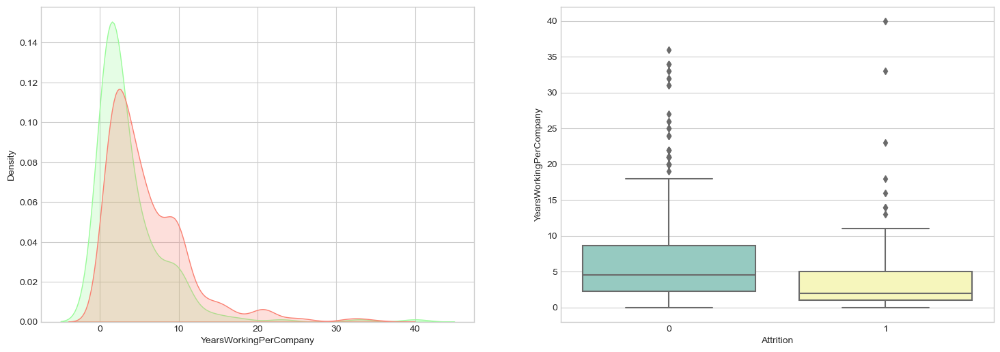

In [29]:
numerical_column_viz('YearsWorkingPerCompany')

## Data Cleansing

Berdasarkan EDA (Stage 1) sebelumnya, maka akan dilakukan data cleansing sebagai berikut :

1. Missing value: There's **no missing value in dataset**
2. Duplicates: There's **no duplicates in dataset**
3. Handle Outliers: **handling outlier with zscore > 3**
4. Feature transformation: **perform transfor log1p for positiveskewed distribution features**

In [30]:
#Transform Possitively Skewed Features
positively_skewed_features = ['DistanceFromHome', 'MonthlyIncome', 'TotalWorkingYears',
                         'YearsAtCompany', 'YearsInCurrentRole', 'YearsWithCurrManager','PercentSalaryHike', 'YearsWorkingPerCompany']

# Log-transform the positively skewed features
for feature in positively_skewed_features:
    df[feature] = np.log1p(df[feature])

# Check the resulting DataFrame
print(df.head())

   Age  Attrition     BusinessTravel  DailyRate              Department  \
0   41          1      Travel_Rarely       1102                   Sales   
1   49          0  Travel_Frequently        279  Research & Development   
2   37          1      Travel_Rarely       1373  Research & Development   
3   33          0  Travel_Frequently       1392  Research & Development   
4   27          0      Travel_Rarely        591  Research & Development   

   DistanceFromHome  Education EducationField  Gender  HourlyRate  ...  \
0          0.693147          2  Life Sciences  Female          94  ...   
1          2.197225          1  Life Sciences    Male          61  ...   
2          1.098612          2          Other    Male          92  ...   
3          1.386294          4  Life Sciences  Female          56  ...   
4          1.098612          1        Medical    Male          40  ...   

   PerformanceRating StockOptionLevel TotalWorkingYears  \
0                  3                0        

In [31]:
df[positively_skewed_features].describe()

,DistanceFromHome,MonthlyIncome,TotalWorkingYears,YearsAtCompany,YearsInCurrentRole,YearsWithCurrManager,PercentSalaryHike,YearsWorkingPerCompany
count,1273.000000,1273.000000,1273.000000,1273.000000,1273.000000,1273.000000,1273.000000,1273.000000
mean,1.994113,8.564473,2.314648,1.780298,1.350212,1.317630,2.760734,1.636734
std,0.853943,0.674585,0.715425,0.767731,0.809814,0.820137,0.215061,0.710524
min,0.693147,6.917706,0.000000,0.000000,0.000000,0.000000,2.484907,0.000000
25%,1.098612,7.976595,1.945910,1.098612,1.098612,1.098612,2.564949,1.098612
50%,2.079442,8.530702,2.397895,1.791759,1.386294,1.386294,2.708050,1.609438
75%,2.708050,9.062072,2.833213,2.397895,2.079442,2.079442,2.944439,2.197225
max,3.401197,9.902187,3.713572,3.713572,2.944439,2.890372,3.258097,3.713572


In [32]:
df.shape

(1273, 28)

### Handling Outliers

In [33]:
# Step 1: Calculate Z-scores for each feature
z_scores = pd.DataFrame()
for col in df.columns:
    if df[col].dtype in [int, float]:
        z_scores[col] = (df[col] - df[col].mean()) / df[col].std()

# Step 2: Identify rows with Z-scores greater than a threshold (e.g., 3 or -3)
threshold = 3
outlier_flags = (z_scores.abs() > threshold).any(axis=1)

# Step 3: Remove the rows with flagged Z-scores (outliers)
df = df[~outlier_flags]

# Check the resulting DataFrame after removing outliers
print(df.head())

   Age  Attrition     BusinessTravel  DailyRate              Department  \
0   41          1      Travel_Rarely       1102                   Sales   
1   49          0  Travel_Frequently        279  Research & Development   
2   37          1      Travel_Rarely       1373  Research & Development   
3   33          0  Travel_Frequently       1392  Research & Development   
4   27          0      Travel_Rarely        591  Research & Development   

   DistanceFromHome  Education EducationField  Gender  HourlyRate  ...  \
0          0.693147          2  Life Sciences  Female          94  ...   
1          2.197225          1  Life Sciences    Male          61  ...   
2          1.098612          2          Other    Male          92  ...   
3          1.386294          4  Life Sciences  Female          56  ...   
4          1.098612          1        Medical    Male          40  ...   

   PerformanceRating StockOptionLevel TotalWorkingYears  \
0                  3                0        

In [34]:
df.describe()

,Age,Attrition,DailyRate,DistanceFromHome,Education,HourlyRate,JobLevel,MonthlyIncome,MonthlyRate,NumCompaniesWorked,...,PerformanceRating,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Accumulated_Satisfaction,YearsWorkingPerCompany
count,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,...,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000
mean,37.511924,0.164547,808.449126,1.994986,2.941176,65.880763,2.102544,8.577294,14326.820350,3.125596,...,3.158188,0.806836,2.334920,2.785374,1.798593,1.365209,2.190779,1.332790,2.734340,1.651963
std,9.168463,0.370919,401.463420,0.855533,1.012117,20.275747,1.119642,0.667034,7126.611002,2.434529,...,0.365062,0.855541,0.685158,1.268946,0.752017,0.801932,3.262113,0.812880,0.426915,0.697337
min,19.000000,0.000000,102.000000,0.693147,1.000000,30.000000,1.000000,6.917706,2094.000000,1.000000,...,3.000000,0.000000,0.693147,0.000000,0.000000,0.000000,0.000000,0.000000,1.600000,0.287682
25%,31.000000,0.000000,469.250000,1.098612,2.000000,48.000000,1.000000,7.992268,8194.500000,1.000000,...,3.000000,0.000000,1.945910,2.000000,1.386294,1.098612,0.000000,1.098612,2.400000,1.098612
50%,36.000000,0.000000,813.000000,2.079442,3.000000,66.000000,2.000000,8.539050,14294.000000,2.000000,...,3.000000,1.000000,2.397895,3.000000,1.791759,1.386294,1.000000,1.386294,2.800000,1.609438
75%,44.000000,0.000000,1167.750000,2.708050,4.000000,83.000000,3.000000,9.068227,20470.000000,4.000000,...,3.000000,1.000000,2.833213,3.000000,2.397895,2.079442,3.000000,2.079442,3.000000,2.197225
max,60.000000,1.000000,1499.000000,3.401197,5.000000,100.000000,5.000000,9.902187,26999.000000,9.000000,...,4.000000,3.000000,3.713572,6.000000,3.713572,2.944439,15.000000,2.890372,4.000000,3.713572


In [35]:
df.shape

(1258, 28)

### Encode Categorical Features

In [36]:
# We will encode the selected categorical features

features_to_onehot_encode = ['BusinessTravel', 'Department', 'EducationField',
                            'MaritalStatus', 'JobRole']

# One-hot encode the selected features
df = pd.get_dummies(df, columns=features_to_onehot_encode)
df.head()

,Age,Attrition,DailyRate,DistanceFromHome,Education,Gender,HourlyRate,JobLevel,MonthlyIncome,MonthlyRate,...,MaritalStatus_Single,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative
0,41,1,1102,0.693147,2,Female,94,2,8.698514,19479,...,1,0,0,0,0,0,0,0,1,0
1,49,0,279,2.197225,1,Male,61,2,8.543056,24907,...,0,0,0,0,0,0,0,1,0,0
2,37,1,1373,1.098612,2,Male,92,1,7.645398,2396,...,1,0,0,1,0,0,0,0,0,0
3,33,0,1392,1.386294,4,Female,56,1,7.975908,23159,...,0,0,0,0,0,0,0,1,0,0
4,27,0,591,1.098612,1,Male,40,1,8.151622,16632,...,0,0,0,1,0,0,0,0,0,0


In [37]:
df['Gender'] = df['Gender'].apply(lambda x:1 if x =="Male" else 0 )

In [38]:
df.head()

,Age,Attrition,DailyRate,DistanceFromHome,Education,Gender,HourlyRate,JobLevel,MonthlyIncome,MonthlyRate,...,MaritalStatus_Single,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative
0,41,1,1102,0.693147,2,0,94,2,8.698514,19479,...,1,0,0,0,0,0,0,0,1,0
1,49,0,279,2.197225,1,1,61,2,8.543056,24907,...,0,0,0,0,0,0,0,1,0,0
2,37,1,1373,1.098612,2,1,92,1,7.645398,2396,...,1,0,0,1,0,0,0,0,0,0
3,33,0,1392,1.386294,4,0,56,1,7.975908,23159,...,0,0,0,0,0,0,0,1,0,0
4,27,0,591,1.098612,1,1,40,1,8.151622,16632,...,0,0,0,1,0,0,0,0,0,0


In [39]:
df.describe()

,Age,Attrition,DailyRate,DistanceFromHome,Education,Gender,HourlyRate,JobLevel,MonthlyIncome,MonthlyRate,...,MaritalStatus_Single,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative
count,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,...,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000
mean,37.511924,0.164547,808.449126,1.994986,2.941176,0.593800,65.880763,2.102544,8.577294,14326.820350,...,0.311606,0.089030,0.032591,0.175676,0.074722,0.099364,0.058029,0.200318,0.219396,0.050874
std,9.168463,0.370919,401.463420,0.855533,1.012117,0.491318,20.275747,1.119642,0.667034,7126.611002,...,0.463334,0.284901,0.177635,0.380695,0.263046,0.299269,0.233891,0.400397,0.414002,0.219829
min,19.000000,0.000000,102.000000,0.693147,1.000000,0.000000,30.000000,1.000000,6.917706,2094.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,31.000000,0.000000,469.250000,1.098612,2.000000,0.000000,48.000000,1.000000,7.992268,8194.500000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,36.000000,0.000000,813.000000,2.079442,3.000000,1.000000,66.000000,2.000000,8.539050,14294.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,44.000000,0.000000,1167.750000,2.708050,4.000000,1.000000,83.000000,3.000000,9.068227,20470.000000,...,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,60.000000,1.000000,1499.000000,3.401197,5.000000,1.000000,100.000000,5.000000,9.902187,26999.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [40]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1258 entries, 0 to 1469
Data columns (total 47 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Age                                1258 non-null   int64  
 1   Attrition                          1258 non-null   int64  
 2   DailyRate                          1258 non-null   int64  
 3   DistanceFromHome                   1258 non-null   float64
 4   Education                          1258 non-null   int64  
 5   Gender                             1258 non-null   int64  
 6   HourlyRate                         1258 non-null   int64  
 7   JobLevel                           1258 non-null   int64  
 8   MonthlyIncome                      1258 non-null   float64
 9   MonthlyRate                        1258 non-null   int64  
 10  NumCompaniesWorked                 1258 non-null   int64  
 11  OverTime                           1258 non-null   int64

### Split Data Train & Test

In [41]:
from sklearn.model_selection import train_test_split

# Separate the target variable from the features
X = df.drop('Attrition', axis=1)
y = df['Attrition']

# Split the data into training and testing sets (75% train, 25% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# Check the shapes of the train and test sets
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

X_train shape: (943, 46)
X_test shape: (315, 46)
y_train shape: (943,)
y_test shape: (315,)


### Scale Data Train & Test

In [42]:
from sklearn.preprocessing import MinMaxScaler

# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Fit and transform the training set
X_train_scaled = scaler.fit_transform(X_train)

# Transform the testing set using the same scaling
X_test_scaled = scaler.transform(X_test)

# Check the scaled data
print("X_train_scaled:\n", X_train_scaled)
print("X_test_scaled:\n", X_test_scaled)

X_train_scaled:
 [[0.12195122 0.19985673 0.59431613 ... 0.         0.         0.        ]
 [0.19512195 0.96561605 0.25595802 ... 1.         0.         0.        ]
 [0.17073171 0.63681948 0.462607   ... 0.         0.         0.        ]
 ...
 [0.31707317 0.87106017 0.62951126 ... 0.         1.         0.        ]
 [0.29268293 0.05730659 0.55540972 ... 0.         0.         0.        ]
 [0.63414634 0.34885387 0.14972585 ... 0.         1.         0.        ]]
X_test_scaled:
 [[0.34146341 0.6969914  0.25595802 ... 0.         0.         0.        ]
 [0.26829268 0.86676218 0.91759992 ... 1.         0.         0.        ]
 [0.75609756 0.63538682 0.51191605 ... 0.         0.         0.        ]
 ...
 [0.53658537 0.26002865 0.74404198 ... 1.         0.         0.        ]
 [0.63414634 0.50358166 0.3383581  ... 0.         0.         0.        ]
 [0.31707317 0.82879656 0.14972585 ... 0.         0.         0.        ]]


### Handle Imbalance Class

In [43]:
from imblearn.over_sampling import RandomOverSampler
from collections import Counter

# Check class distribution before oversampling
print("Before oversampling:", Counter(y_train))

# Initialize the RandomOverSampler
oversampler = RandomOverSampler(random_state=42)

# Fit and apply the oversampler only to the training set
X_train_resampled, y_train_resampled = oversampler.fit_resample(X_train_scaled, y_train)

# Check class distribution after oversampling
print("After oversampling:", Counter(y_train_resampled))

Before oversampling: Counter({0: 783, 1: 160})
After oversampling: Counter({1: 783, 0: 783})


### Feature Selection

In [46]:
# Convert the X_train_resampled array back to a DataFrame
X_train_resampled_df = pd.DataFrame(X_train_resampled, columns=X_train.columns)

# Calculate the correlation between each feature and the target variable 'Attrition'
correlations = X_train_resampled_df.corrwith(y_train_resampled)

# Filter features based on correlation threshold
correlation_threshold = 0.07
selected_features = correlations[(correlations > correlation_threshold) | (correlations < -correlation_threshold)]

# Print the selected features and their correlations with 'Attrition'
print(selected_features)

Age                                 -0.185290
DistanceFromHome                     0.088111
JobLevel                            -0.269263
MonthlyIncome                       -0.289819
OverTime                             0.316957
StockOptionLevel                    -0.177223
TotalWorkingYears                   -0.316374
TrainingTimesLastYear               -0.071212
YearsAtCompany                      -0.241875
YearsInCurrentRole                  -0.221577
YearsWithCurrManager                -0.243990
Accumulated_Satisfaction            -0.257034
YearsWorkingPerCompany              -0.311132
BusinessTravel_Non-Travel           -0.151092
BusinessTravel_Travel_Frequently     0.171550
BusinessTravel_Travel_Rarely        -0.070391
Department_Research & Development   -0.159602
Department_Sales                     0.150334
EducationField_Medical              -0.103605
MaritalStatus_Divorced              -0.110062
MaritalStatus_Married               -0.121614
MaritalStatus_Single              

### Recommendation Feature Outside This Dataset

**Recommendations:**
1. Performance Feedback: Frequency and quality of feedback received by the employee.
2. Job Stability: The stability or likelihood of future job changes.
3. Career Growth Opportunities: The perceived potential for career advancement within the company.
4. Company Culture: Employee perceptions of the overall company culture and values.
5. Employee Engagement: The level of employee commitment and emotional attachment to the organization.